In [59]:
import pandas as pd
import numpy as np
import os
import sys

#https://www.kaggle.com/jeffd23/the-nature-conservancy-fisheries-monitoring/deep-learning-in-the-deep-blue-lb-1-279
#https://www.kaggle.com/narae78/the-nature-conservancy-fisheries-monitoring/fish-detection
#https://www.kaggle.com/andrelopes1705/the-nature-conservancy-fisheries-monitoring/lasagne-based-of-zfturbo-keras-code/code
#https://www.youtube.com/watch?v=qIUh3CEeTqg
#https://medium.com/@ageitgey/machine-learning-is-fun-part-3-deep-learning-and-convolutional-neural-networks-f40359318721#.f8uh9jgiu
#http://blog.xebia.fr/2017/03/01/tensorflow-deep-learning-episode-1-introduction/
#http://cs231n.github.io/neural-networks-3/

In [60]:
TRAIN_PATH = './data/train'

In [61]:
def listFiles():
    map_dir_files = {}
    for d in os.listdir(TRAIN_PATH):
        d = os.path.join(TRAIN_PATH,d)
        if os.path.isdir(d):
            files = os.listdir(d)
            map_dir_files [d] = files
            sys.stderr.writelines("Nb files for %s: %d \n" % (d, len(files)))
    return map_dir_files

In [62]:
%time map_dir_files = listFiles()

Nb files for ./data/train\ALB: 1719 
Nb files for ./data/train\BET: 200 
Nb files for ./data/train\DOL: 117 
Nb files for ./data/train\LAG: 67 
Nb files for ./data/train\NoF: 465 
Nb files for ./data/train\OTHER: 299 
Nb files for ./data/train\SHARK: 176 


Wall time: 4.52 s


Nb files for ./data/train\YFT: 734 


In [63]:
from PIL import Image
import matplotlib.pyplot as plt
import random
%matplotlib inline

In [64]:
def plot_graph(fish, nbfiles, nbcolumns, is_random = True):
    files = os.listdir(fish)
    nblines = int(nbfiles / nbcolumns)
    fig, ax = plt.subplots(nrows=nblines, ncols=nbcolumns, figsize=(15,15))
    ax = ax.flatten()
   
    for i in range(0,nbfiles):
        f = random.choice(files) if is_random else files[i]
        img = Image.open(os.path.join(fish,f))
        ax[i].imshow(img)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
        ax[i].set_title("%s h:%s w:%s" % (f, img.height,img.width))
    plt.tight_layout()

Wall time: 5.53 s


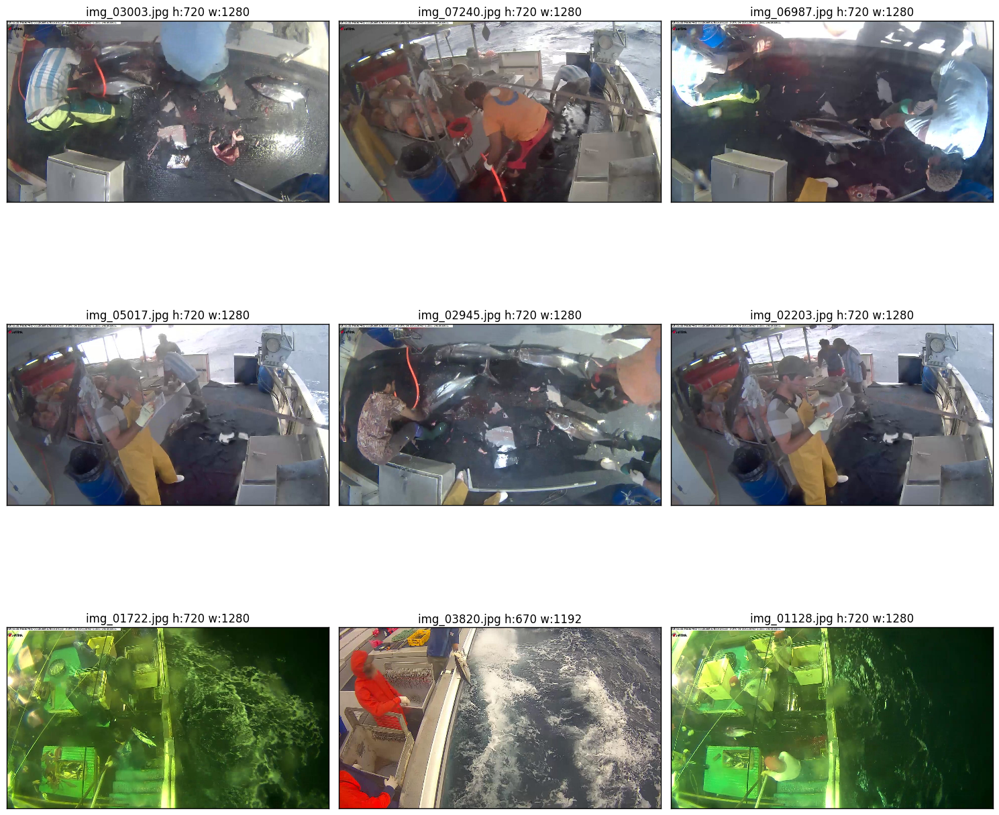

In [65]:
%time plot_graph(os.path.join(TRAIN_PATH,'ALB'), 9, 3 )

Wall time: 2.54 s


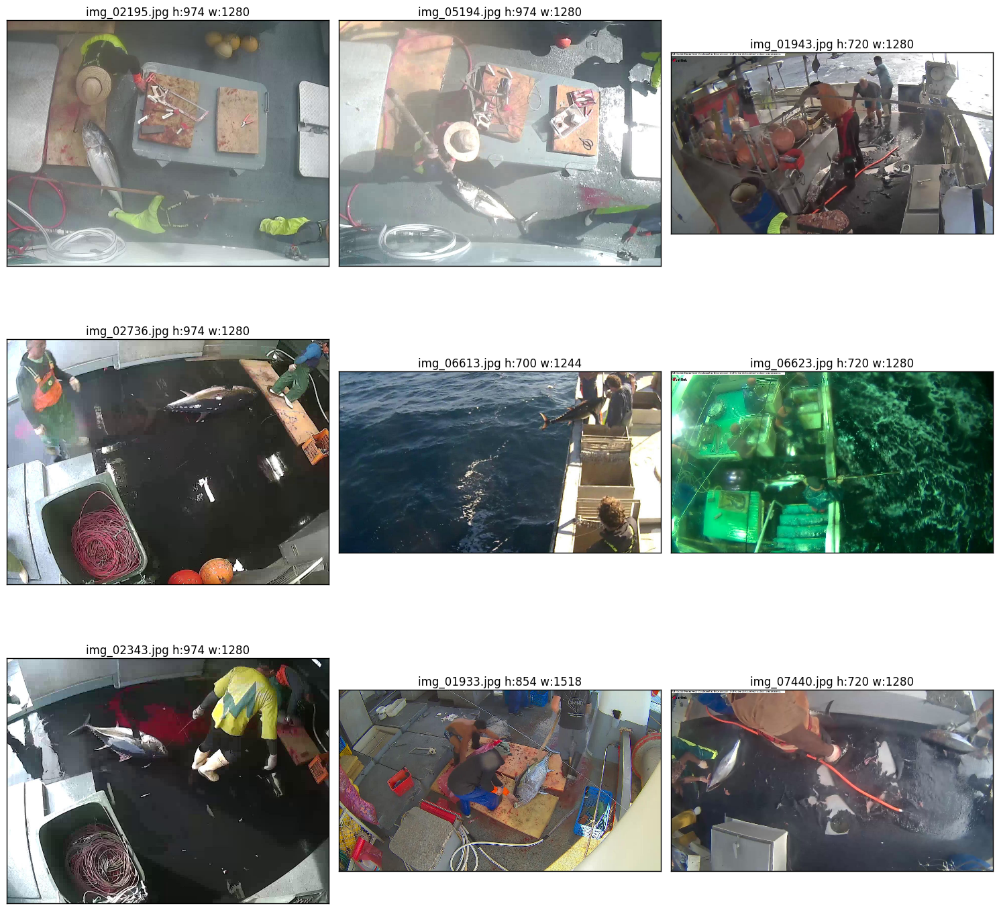

In [66]:
%time plot_graph(os.path.join(TRAIN_PATH,'BET'), 9, 3 )

Wall time: 2.62 s


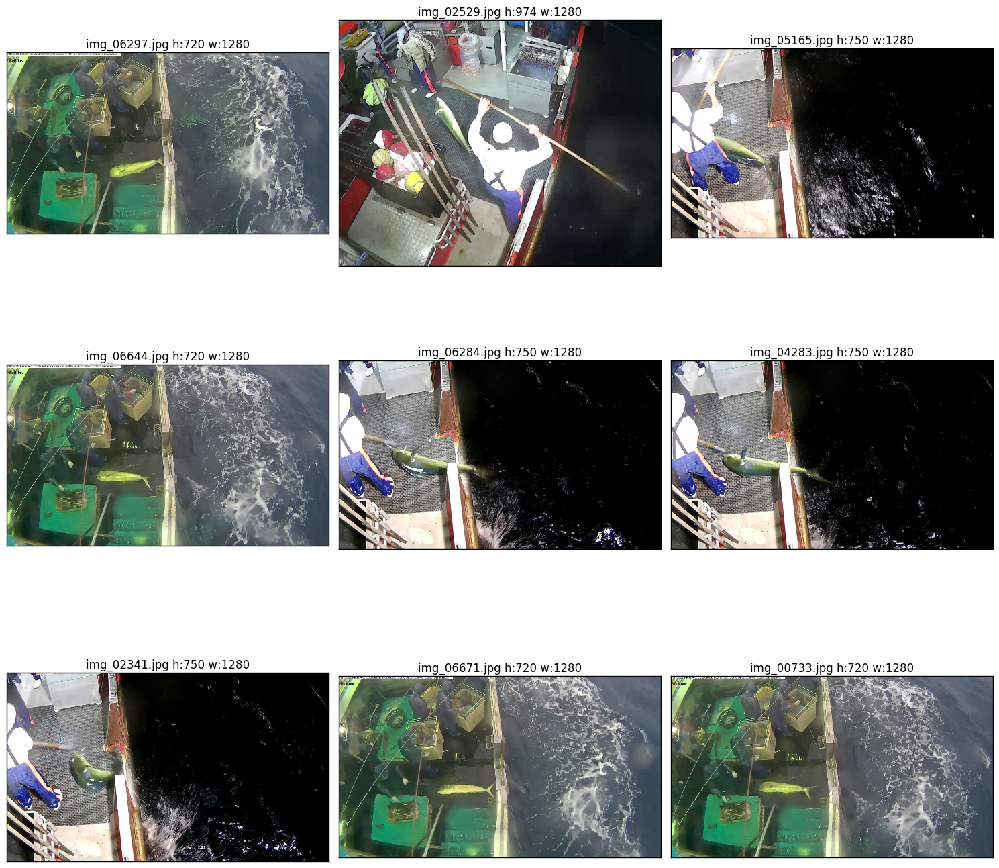

In [67]:
%time plot_graph(os.path.join(TRAIN_PATH,'DOL'), 9, 3 )

Wall time: 2.47 s


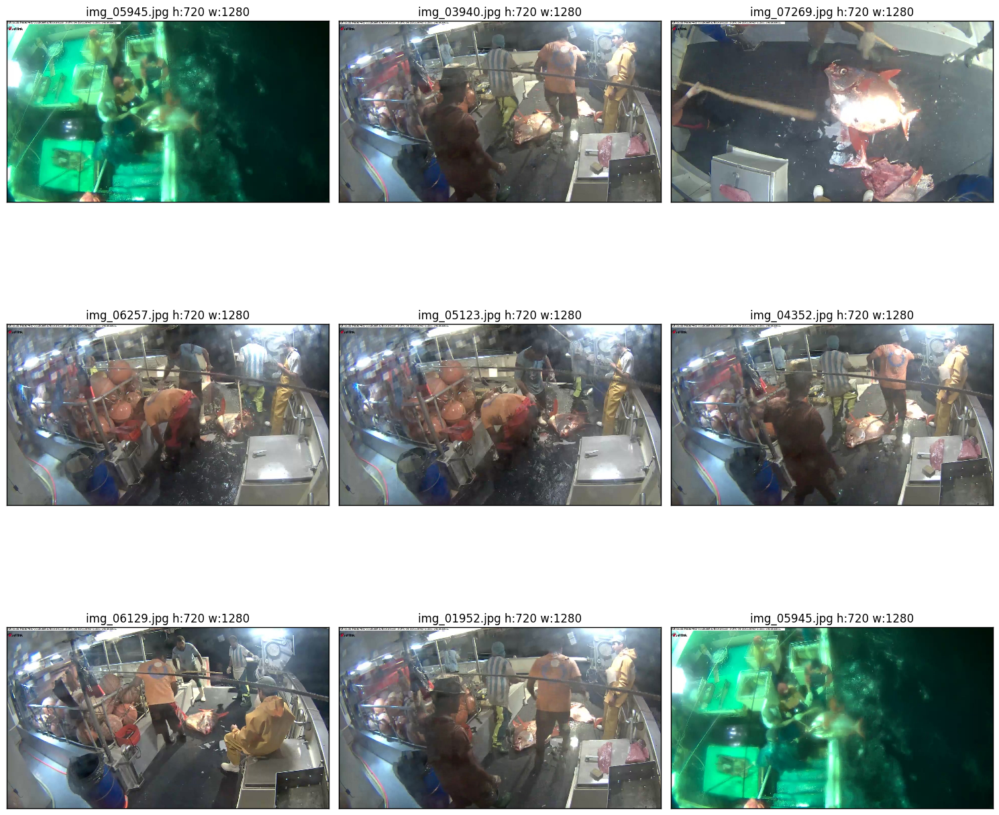

In [68]:
%time plot_graph(os.path.join(TRAIN_PATH,'LAG'), 9, 3 )

Wall time: 1.54 s


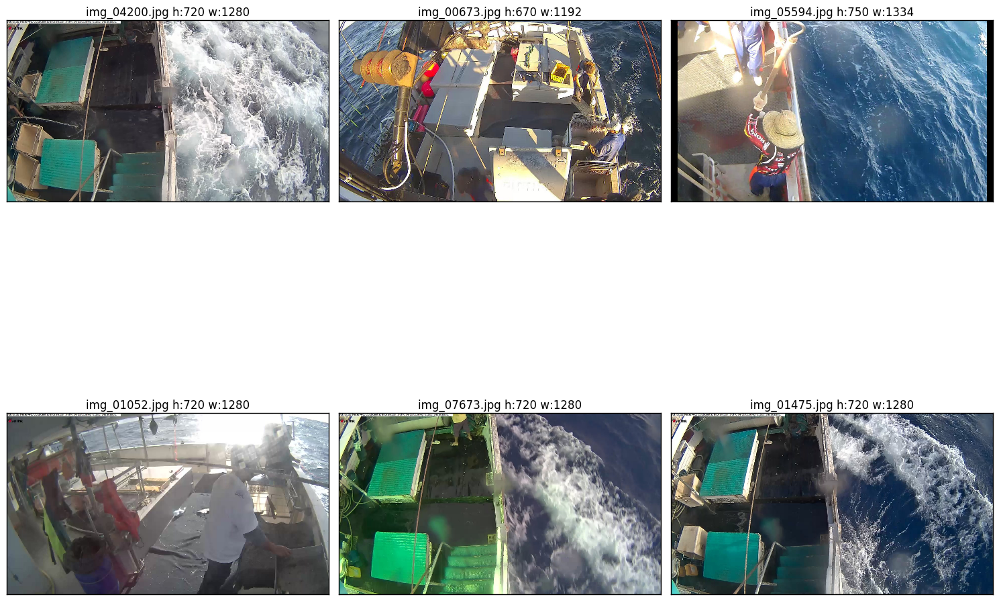

In [69]:
%time plot_graph(os.path.join(TRAIN_PATH,'Nof'),6, 3 )

In [70]:
def get_all_files(root_dir):
    list_files = []
    for root, subdirs, files in os.walk(root_dir):
            list_files.extend([os.path.join(root,f) for f in files])
    return list_files

In [71]:
%time list_files = get_all_files(TRAIN_PATH)
list_files[:10]

Wall time: 435 ms


['./data/train\\ALB\\img_00003.jpg',
 './data/train\\ALB\\img_00010.jpg',
 './data/train\\ALB\\img_00012.jpg',
 './data/train\\ALB\\img_00015.jpg',
 './data/train\\ALB\\img_00019.jpg',
 './data/train\\ALB\\img_00020.jpg',
 './data/train\\ALB\\img_00029.jpg',
 './data/train\\ALB\\img_00032.jpg',
 './data/train\\ALB\\img_00037.jpg',
 './data/train\\ALB\\img_00038.jpg']

In [72]:
np_files = np.array(list_files)
%time shapes = [Image.open(f).size for f in list_files]

Wall time: 2min 17s


In [73]:
import pandas as pd

In [74]:
pd.Series(shapes).value_counts()

(1280, 720)    2174
(1280, 750)     598
(1280, 974)     395
(1276, 718)     220
(1192, 670)     198
(1280, 924)      60
(1518, 854)      39
(1732, 974)      35
(1334, 750)      31
(1244, 700)      27
dtype: int64

## Data split

In [75]:
#conda install -c https://conda.binstar.org/menpo opencv3
import cv2
print (cv2.__version__)
print (cv2.__file__)

3.1.0
C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\cv2.cp35-win_amd64.pyd


In [76]:
N_COLS = 128
N_ROWS = 128

In [77]:
def build_X_y(files, COLS = 160, ROWS = 90,  CHANNELS =3):
    X = np.ndarray((len(files), ROWS, COLS, CHANNELS), dtype = np.float32)
    y = []
    
    for i,im in enumerate(files):
        fish = str.split(os.path.dirname(im), os.sep)[-1]
        if i%500 == 0:
            sys.stderr.writelines("file:%s y:%s  %d/%d \n" % (im.title(), fish, i ,len(files)))
            sys.stderr.flush()
        
        im = cv2.imread(im,cv2.IMREAD_COLOR)
        X[i] = cv2.resize(im, (COLS,ROWS), interpolation=cv2.INTER_CUBIC)
        y.append(fish)
    return X,y

In [78]:
%time X,y = build_X_y(list_files, COLS = N_COLS, ROWS = N_ROWS)

file:./Data/Train\Alb\Img_00003.Jpg y:ALB  0/3777 
file:./Data/Train\Alb\Img_02263.Jpg y:ALB  500/3777 
file:./Data/Train\Alb\Img_04683.Jpg y:ALB  1000/3777 
file:./Data/Train\Alb\Img_07078.Jpg y:ALB  1500/3777 
file:./Data/Train\Dol\Img_05446.Jpg y:DOL  2000/3777 
file:./Data/Train\Nof\Img_06610.Jpg y:NoF  2500/3777 
file:./Data/Train\Shark\Img_06082.Jpg y:SHARK  3000/3777 
file:./Data/Train\Yft\Img_04918.Jpg y:YFT  3500/3777 


Wall time: 4min 33s


In [79]:
FOLDER_RESIZED = 'RESIZED'
if not os.path.exists(FOLDER_RESIZED):
    os.mkdir(FOLDER_RESIZED)

In [80]:
for i in range(12):
    im = random.choice(X)
    im_name = os.path.join(FOLDER_RESIZED,"im_%s.jpg" % i)
    %time cv2.imwrite(im_name, im)

Wall time: 525 ms
Wall time: 58 ms
Wall time: 40.3 ms
Wall time: 26 ms
Wall time: 24 ms
Wall time: 31 ms
Wall time: 26 ms
Wall time: 31 ms
Wall time: 21 ms
Wall time: 19 ms
Wall time: 26.1 ms
Wall time: 52.4 ms


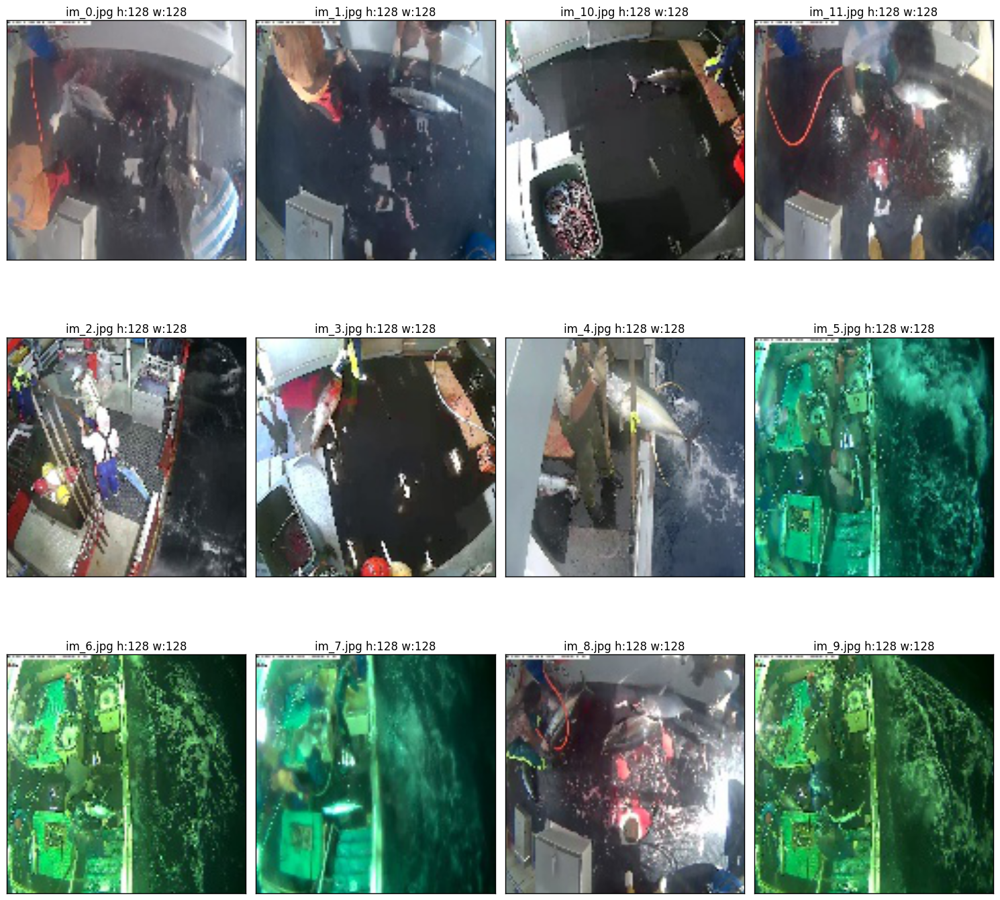

In [81]:
plot_graph(FOLDER_RESIZED,12,4,is_random = False)

In [82]:
from sklearn.cross_validation import train_test_split

In [83]:
%time X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.9, random_state=42, stratify=y)

Wall time: 1.44 s


In [84]:
sys.stderr.writelines('Nb values: %d \n' % len(y_train))

alb_ratio_train = np.count_nonzero(np.asarray(y_train) == 'ALB') / len(y_train)
sys.stderr.writelines('Ratio ALB in train: %f \n' % alb_ratio_train)

alb_ratio_test = np.count_nonzero(np.asarray(y_test) == 'ALB') / len(y_test)
sys.stderr.writelines('Ratio ALB in test: %f \n' % alb_ratio_test)

dol_ratio_train = np.count_nonzero(np.asarray(y_train) == 'DOL') / len(y_train)
sys.stderr.writelines('Ratio DOL in train: %f \n' % dol_ratio_train)

dol_ratio_test = np.count_nonzero(np.asarray(y_test) == 'DOL') / len(y_test)
sys.stderr.writelines('Ratio DOL in test: %f \n' % dol_ratio_test)

Nb values: 378 
Ratio ALB in train: 0.455026 
Ratio ALB in test: 0.455134 
Ratio DOL in train: 0.031746 
Ratio DOL in test: 0.030891 


In [85]:
shapes = [x.shape for x in X]
pd.Series(shapes).value_counts()

(128, 128, 3)    3777
dtype: int64

In [86]:
from sklearn import preprocessing

In [87]:
lbl_encoder = preprocessing.LabelEncoder()

In [88]:
y_train_encoded = lbl_encoder.fit_transform(y_train)
y_train_encoded

array([7, 7, 0, 4, 5, 4, 7, 4, 7, 7, 0, 7, 0, 0, 4, 7, 2, 7, 0, 7, 0, 0, 0,
       0, 7, 7, 1, 7, 0, 1, 1, 0, 0, 0, 7, 5, 0, 0, 0, 0, 0, 5, 7, 1, 6, 1,
       0, 4, 0, 0, 5, 0, 5, 6, 7, 6, 6, 1, 2, 0, 4, 0, 6, 0, 0, 0, 7, 0, 7,
       4, 7, 7, 2, 0, 1, 0, 7, 7, 0, 7, 7, 0, 0, 0, 7, 4, 6, 0, 0, 4, 0, 5,
       7, 5, 0, 0, 7, 0, 5, 4, 5, 6, 0, 7, 7, 6, 4, 0, 0, 3, 1, 0, 4, 7, 7,
       2, 5, 7, 0, 3, 0, 7, 5, 4, 6, 0, 0, 0, 0, 7, 7, 7, 0, 7, 6, 7, 0, 0,
       0, 0, 0, 6, 4, 4, 0, 7, 4, 0, 2, 7, 1, 0, 0, 7, 0, 1, 0, 0, 5, 1, 7,
       7, 0, 6, 7, 0, 0, 5, 7, 0, 2, 4, 0, 5, 0, 0, 0, 5, 0, 4, 2, 0, 3, 0,
       7, 7, 4, 0, 0, 0, 0, 7, 0, 0, 0, 0, 6, 5, 7, 0, 0, 4, 1, 0, 0, 1, 4,
       5, 7, 5, 0, 0, 4, 0, 0, 1, 2, 7, 0, 7, 7, 7, 4, 7, 0, 5, 4, 0, 0, 0,
       0, 0, 0, 4, 5, 6, 0, 7, 5, 0, 0, 0, 0, 0, 4, 7, 7, 7, 5, 0, 0, 5, 4,
       0, 2, 0, 4, 0, 0, 7, 7, 5, 0, 0, 0, 0, 7, 1, 1, 0, 4, 7, 5, 0, 0, 0,
       0, 0, 4, 3, 6, 0, 4, 0, 0, 0, 0, 4, 4, 2, 0, 3, 0, 0, 6, 0, 5, 0, 0,
       7, 0,

In [89]:
y_test_encoded = lbl_encoder.transform(y_test)
y_test_encoded

array([7, 7, 7, ..., 7, 0, 5], dtype=int64)


## Tensor Flow

In [90]:
#conda install -c conda-forge tensorflow
import tensorflow as tf
from tensorflow.contrib import learn
from tensorflow.contrib.learn.python.learn.estimators import model_fn as model_fn_lib

In [91]:
N_OUTPUT= 8

In [92]:
sess = tf.InteractiveSession()

Constants are initialized when you call tf.constant, and their value can never change. By contrast, variables are not initialized when you call tf.Variable. To initialize all the variables in a TensorFlow program, you must explicitly call a special operation as follows:

## Build Estimator

In [93]:
def cnn_model(X, output, mode):

    ## Input
    #X = tf.placeholder(tf.float32, shape=[None, 128, 128, 3], name="X")
    X = tf.reshape(X, [-1, 128, 128, 3])
    
    ## 1st Convolutional Layer
    conv1 = tf.layers.conv2d(
        inputs = X,
        filters = 64,
        kernel_size = [5,5],
        padding = 'same',    
        use_bias = True,
        kernel_initializer = None,
        bias_initializer = None,
        activation = tf.nn.relu,
        name='conv1'
    )
    
    ## 1st Pooling layer
    pool1 = tf.layers.max_pooling2d(
        inputs = conv1,
        pool_size=[2,2],
        strides=[2,2],
        name='pool1'
    )
    
    ## 2nd convolutional layer
    conv2 = tf.layers.conv2d(
        inputs = pool1,
        filters = 128,
        kernel_size =[5,5],
        padding='same',
        use_bias=True,kernel_initializer = None,
        bias_initializer = None,
        activation=tf.nn.relu,
        name='pool2'
    )
    
    
    ## 2nd Pooling layer 
    pool2 = tf.layers.max_pooling2d(
        inputs=conv2, 
        pool_size=[2,2],
        strides=[2,2]
    )
    
    ## Densely connected layer
    pool2_flat = tf.reshape(pool2,  [-1, 32 * 32 * 128])
    
    dense = tf.layers.dense(
        inputs=pool2_flat,
        units=1024,
        activation=tf.nn.relu
    )
    
    ## Dropout layer
    dropout=tf.layers.dropout(
        inputs = dense,
        rate = 0.4, #dropout_rate
        training = mode == learn.ModeKeys.TRAIN
    )
    
    ## Logits
    logits = tf.layers.dense(
        inputs = dropout,
        units = 8
    )
    
    loss = None
    train_op = None
    
    #Calculate loss for TRAIN and EVAL
    if mode != learn.ModeKeys.INFER:
        onehot_labels = tf.one_hot(
            indices = output,
            depth = 8
        )
        
        loss = tf.losses.softmax_cross_entropy(
            onehot_labels = onehot_labels,
            logits = logits
        ) 
    
    #training mode
    if mode == learn.ModeKeys.TRAIN:
        train_op = tf.contrib.layers.optimize_loss(
            loss = loss,
            global_step = tf.contrib.framework.get_global_step(),
            learning_rate = 0.0001,
            optimizer ='SGD'
        )
        
    #Generate predictions
    predictions = {
        'classes' : tf.arg_max(
            input = logits, 
            dimension = 1),
        'probabilities' : tf.nn.softmax(
            logits = logits, 
            name='softmax_tensor')
    }
        
    #Return a modelfnOps
    return model_fn_lib.ModelFnOps(
        mode = mode,
        predictions = predictions,
        loss = loss,
        train_op = train_op
    )

In [94]:
LOG_FOLDER = os.path.join(os.getcwd(), 'logs')
if not os.path.exists(LOG_FOLDER):
    os.mkdir(LOG_FOLDER)

In [95]:
classifier = learn.Estimator(
    model_fn = cnn_model, 
    model_dir = LOG_FOLDER
)

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_task_id': 0, '_keep_checkpoint_every_n_hours': 10000, '_environment': 'local', '_is_chief': True, '_save_checkpoints_steps': None, '_num_ps_replicas': 0, '_tf_random_seed': None, '_tf_config': gpu_options {
  per_process_gpu_memory_fraction: 1
}
, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000007E4DD0AB00>, '_keep_checkpoint_max': 5, '_master': '', '_task_type': None, '_save_checkpoints_secs': 600, '_save_summary_steps': 100, '_evaluation_master': ''}


In [96]:
#Logging
tensors_to_log = {'probabilities' : 'softmax_tensor'}
logging_hook = tf.train.LoggingTensorHook(
    tensors = tensors_to_log,
    every_n_iter = 50
)

In [97]:
sess.run(tf.global_variables_initializer())

In [98]:
#Classifier
classifier.fit(
    x = X_train, 
    y = y_train_encoded, 
    batch_size = 100, 
    monitors = [logging_hook], 
    max_steps = 10
)

Instructions for updating:
Estimator is decoupled from Scikit Learn interface by moving into
separate class SKCompat. Arguments x, y and batch_size are only
available in the SKCompat class, Estimator will only accept input_fn.
Example conversion:
  est = Estimator(...) -> est = SKCompat(Estimator(...))
Instructions for updating:
Estimator is decoupled from Scikit Learn interface by moving into
separate class SKCompat. Arguments x, y and batch_size are only
available in the SKCompat class, Estimator will only accept input_fn.
Example conversion:
  est = Estimator(...) -> est = SKCompat(Estimator(...))
Instructions for updating:
Estimator is decoupled from Scikit Learn interface by moving into
separate class SKCompat. Arguments x, y and batch_size are only
available in the SKCompat class, Estimator will only accept input_fn.
Example conversion:
  est = Estimator(...) -> est = SKCompat(Estimator(...))


C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\tensorflow\python\util\deprecation.py:247: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
  equality = a == b


INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Saving checkpoints for 1 into C:\workspace\natural_life_conservancy\logs\model.ckpt.
INFO:tensorflow:loss = 79.749, step = 1
INFO:tensorflow:probabilities = [[  1.51927104e-29   9.53357666e-30   1.32410938e-09   1.45646709e-06
    2.74326823e-07   4.87919004e-13   4.48231896e-09   9.99998212e-01]
 [  0.00000000e+00   2.43911093e-27   0.00000000e+00   1.00000000e+00
    1.28548785e-27   0.00000000e+00   0.00000000e+00   9.46866699e-18]
 [  2.63699036e-38   5.01746735e-24   1.82617876e-23   4.09970227e-07
    4.66862313e-12   5.49750324e-26   6.07910807e-24   9.99999642e-01]
 [  5.34518023e-28   0.00000000e+00   0.00000000e+00   9.99958992e-01
    2.67988565e-11   0.00000000e+00   4.68445771e-25   4.09833956e-05]
 [  0.00000000e+00   0.00000000e+00   0.00000000e+00   1.00000000e+00
    0.00000000e+00   1.19276647e-26   2.73656349e-29   1.91222823e-16]
 [  2.78690264e-34   8.65746358e-20   4.82215342e-20   1.00000000e+00
    1.28

Estimator(params=None)

In [99]:
#Configure the metrics
metrics ={
    'acuracy' : learn.MetricSpec(
        metric_fn = tf.metrics.accuracy,
        prediction_key='classes'
    )
}

In [100]:
#Prediciton
evalutations = classifier.evaluate(
    x = X_test, 
    y = y_test_encoded, 
    metrics=metrics
)
print(evalutations)

Instructions for updating:
Estimator is decoupled from Scikit Learn interface by moving into
separate class SKCompat. Arguments x, y and batch_size are only
available in the SKCompat class, Estimator will only accept input_fn.
Example conversion:
  est = Estimator(...) -> est = SKCompat(Estimator(...))
Instructions for updating:
Estimator is decoupled from Scikit Learn interface by moving into
separate class SKCompat. Arguments x, y and batch_size are only
available in the SKCompat class, Estimator will only accept input_fn.
Example conversion:
  est = Estimator(...) -> est = SKCompat(Estimator(...))


C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\tensorflow\python\util\deprecation.py:247: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
  equality = a == b


INFO:tensorflow:Starting evaluation at 2017-03-21-23:50:26


ResourceExhaustedError: OOM when allocating tensor with shape[3399,128,128,64]
	 [[Node: conv1/convolution = Conv2D[T=DT_FLOAT, data_format="NHWC", padding="SAME", strides=[1, 1, 1, 1], use_cudnn_on_gpu=true, _device="/job:localhost/replica:0/task:0/cpu:0"](Reshape, conv1/kernel/read)]]

Caused by op 'conv1/convolution', defined at:
  File "C:\Users\el_ma_000\Anaconda3_5\lib\runpy.py", line 184, in _run_module_as_main
    "__main__", mod_spec)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\ipykernel\__main__.py", line 3, in <module>
    app.launch_new_instance()
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\traitlets\config\application.py", line 653, in launch_instance
    app.start()
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\ipykernel\kernelapp.py", line 474, in start
    ioloop.IOLoop.instance().start()
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\zmq\eventloop\ioloop.py", line 162, in start
    super(ZMQIOLoop, self).start()
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\tornado\ioloop.py", line 887, in start
    handler_func(fd_obj, events)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\tornado\stack_context.py", line 275, in null_wrapper
    return fn(*args, **kwargs)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\zmq\eventloop\zmqstream.py", line 440, in _handle_events
    self._handle_recv()
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\zmq\eventloop\zmqstream.py", line 472, in _handle_recv
    self._run_callback(callback, msg)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\zmq\eventloop\zmqstream.py", line 414, in _run_callback
    callback(*args, **kwargs)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\tornado\stack_context.py", line 275, in null_wrapper
    return fn(*args, **kwargs)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\ipykernel\kernelbase.py", line 276, in dispatcher
    return self.dispatch_shell(stream, msg)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\ipykernel\kernelbase.py", line 228, in dispatch_shell
    handler(stream, idents, msg)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\ipykernel\kernelbase.py", line 390, in execute_request
    user_expressions, allow_stdin)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\ipykernel\ipkernel.py", line 196, in do_execute
    res = shell.run_cell(code, store_history=store_history, silent=silent)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\ipykernel\zmqshell.py", line 501, in run_cell
    return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\IPython\core\interactiveshell.py", line 2717, in run_cell
    interactivity=interactivity, compiler=compiler, result=result)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\IPython\core\interactiveshell.py", line 2821, in run_ast_nodes
    if self.run_code(code, result):
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\IPython\core\interactiveshell.py", line 2881, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-100-f1f515360d53>", line 5, in <module>
    metrics=metrics
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\tensorflow\python\util\deprecation.py", line 280, in new_func
    return func(*args, **kwargs)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\tensorflow\contrib\learn\python\learn\estimators\estimator.py", line 501, in evaluate
    return SKCompat(self).score(x, y, batch_size, steps, metrics)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\tensorflow\contrib\learn\python\learn\estimators\estimator.py", line 1368, in score
    name='score')
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\tensorflow\contrib\learn\python\learn\estimators\estimator.py", line 810, in _evaluate_model
    eval_ops = self._get_eval_ops(features, labels, metrics)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\tensorflow\contrib\learn\python\learn\estimators\estimator.py", line 1190, in _get_eval_ops
    features, labels, model_fn_lib.ModeKeys.EVAL)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\tensorflow\contrib\learn\python\learn\estimators\estimator.py", line 1133, in _call_model_fn
    model_fn_results = self._model_fn(features, labels, **kwargs)
  File "<ipython-input-93-7fc95417d59e>", line 17, in cnn_model
    name='conv1'
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\tensorflow\python\layers\convolutional.py", line 509, in conv2d
    return layer.apply(inputs)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\tensorflow\python\layers\base.py", line 303, in apply
    return self.__call__(inputs, **kwargs)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\tensorflow\python\layers\base.py", line 273, in __call__
    outputs = self.call(inputs, **kwargs)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\tensorflow\python\layers\convolutional.py", line 156, in call
    data_format=utils.convert_data_format(self.data_format, self.rank + 2))
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\tensorflow\python\ops\nn_ops.py", line 639, in convolution
    op=op)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\tensorflow\python\ops\nn_ops.py", line 308, in with_space_to_batch
    return op(input, num_spatial_dims, padding)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\tensorflow\python\ops\nn_ops.py", line 631, in op
    name=name)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\tensorflow\python\ops\nn_ops.py", line 129, in _non_atrous_convolution
    name=name)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\tensorflow\python\ops\gen_nn_ops.py", line 396, in conv2d
    data_format=data_format, name=name)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\tensorflow\python\framework\op_def_library.py", line 763, in apply_op
    op_def=op_def)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\tensorflow\python\framework\ops.py", line 2395, in create_op
    original_op=self._default_original_op, op_def=op_def)
  File "C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\tensorflow\python\framework\ops.py", line 1264, in __init__
    self._traceback = _extract_stack()

ResourceExhaustedError (see above for traceback): OOM when allocating tensor with shape[3399,128,128,64]
	 [[Node: conv1/convolution = Conv2D[T=DT_FLOAT, data_format="NHWC", padding="SAME", strides=[1, 1, 1, 1], use_cudnn_on_gpu=true, _device="/job:localhost/replica:0/task:0/cpu:0"](Reshape, conv1/kernel/read)]]


In [ ]:
print(type(X_train[0][0][0][0]))

In [ ]:
mnist = learn.datasets.load_dataset("mnist")
train_data = mnist.train.images

In [ ]:
print(type(train_data))

In [ ]:
print(type(X_train))

In [ ]:
print(X)